# **COVID 19 PROJECT**

# **Part 2: Exploratory data analysis** 

Importing libraries

In [297]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import warnings
warnings.filterwarnings('ignore')

In [298]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity="all"

In [299]:
#set number formatting
pd.options.display.float_format = '{:,.2f}'.format

Importing data set

In [300]:
data = pd.read_csv('/content/Covid_clean_data.csv')

In [301]:
data.dtypes

continent                   object
country                     object
date                        object
total_cases                float64
new_cases                  float64
total_deaths               float64
new_deaths                 float64
icu_patients               float64
people_fully_vaccinated    float64
population                 float64
dtype: object

In [302]:
# convert 'date' from object to datetime
data['date'] = pd.to_datetime(data['date'])

##**Worldwise analysis**

**New cases and new deaths**

In [303]:
world = data.groupby('date')['new_cases','new_deaths'].sum().reset_index()

from plotly.subplots import make_subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("new_cases", "new_deaths"))
import plotly.graph_objects as go
trace1 = go.Scatter(x=world['date'], y=world['new_cases'], name="new_cases", line_color='yellow', mode='lines+markers')
trace2 = go.Scatter(x=world['date'], y=world['new_deaths'], name="new_deaths", line_color='red', mode='lines+markers')
import plotly.io as pio
pio.templates.default = "plotly_dark"
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.update_layout(template="plotly_dark",title_text = '<b>Global Spread of Covid 19 Over Time </b>',
                  font=dict(family="Arial, Balto",color='white'))
fig.show()

We can see the number of cases and number of deaths are much far different. Therefore, to plot them on 1 chart to see the correlation, we need to normalize data first by using Min Max Scaler function.

In [304]:
# Setting 'date' attribute as index
dataScale = data.set_index('date')
dataScale.head()

,continent,country,total_cases,new_cases,total_deaths,new_deaths,icu_patients,people_fully_vaccinated,population
date,,,,,,,,,
2020-02-24,Asia,Afghanistan,5.00,5.00,0.00,0.00,0.00,0.00,"39,835,428.00"
2020-02-25,Asia,Afghanistan,5.00,0.00,0.00,0.00,0.00,0.00,"39,835,428.00"
2020-02-26,Asia,Afghanistan,5.00,0.00,0.00,0.00,0.00,0.00,"39,835,428.00"
2020-02-27,Asia,Afghanistan,5.00,0.00,0.00,0.00,0.00,0.00,"39,835,428.00"
2020-02-28,Asia,Afghanistan,5.00,0.00,0.00,0.00,0.00,0.00,"39,835,428.00"


In [305]:
# Normalize new cases and new deaths
from sklearn.preprocessing import MinMaxScaler
Scale = MinMaxScaler()
dataScale[['new_cases', 'new_deaths']] = Scale.fit_transform(dataScale[['new_cases', 'new_deaths']])
print(dataScale[['new_cases', 'new_deaths']])

            new_cases  new_deaths
date                             
2020-02-24       0.20        0.18
2020-02-25       0.20        0.18
2020-02-26       0.20        0.18
2020-02-27       0.20        0.18
2020-02-28       0.20        0.18
...               ...         ...
2022-01-18       0.20        0.18
2022-01-19       0.20        0.18
2022-01-20       0.20        0.18
2022-01-21       0.20        0.18
2022-01-22       0.20        0.18

[146819 rows x 2 columns]


<Figure size 720x360 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Total number')

Text(0.5, 1.0, 'New cases and New deaths')

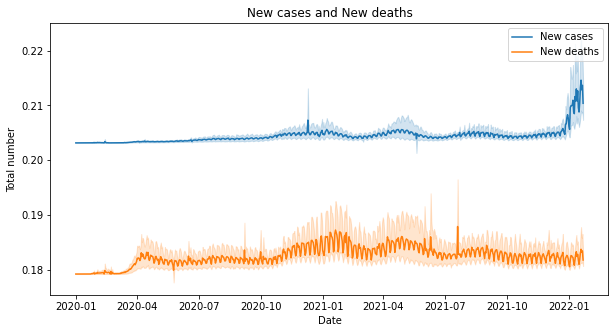

In [306]:
# Plotting for new cases and new deaths
plt.figure(figsize=(10,5))
sns.lineplot(data = dataScale['new_cases'],label='New cases')
sns.lineplot(data = dataScale['new_deaths'],label='New deaths')
plt.xlabel('Date')
plt.ylabel('Total number')
plt.title('New cases and New deaths')
plt.legend()

When new cases and new deaths are plotted on the same scale, we can see:
1. The number of cases is  much higher than the number of deaths.
2. There are 4 waves of new cases that affected the world which correspondingly match with 4 variants of Covid-19: the original variant, beta, delta and omicron. But the latest variant (Omicron) has rapidly surged past other variants to become the dominant SARS-CoV-2 strain. The truth is Omicron is the most superspreading variant till now.
3. There are a similarity between waves of new cases and waves of new deaths. When the new cases increased, new deaths also increase too. But after vaccinations (end of 2020), new deaths are likely to decrease. While the trend of new cases is going up, the trend of new deaths went down and remained unchanged. This can be explained by 2 reasons: the effectiveness of vaccines and the Omicron variant is less severe than other previous ones.

**Icu patients and people fully vaccinated**

In [307]:
# Normalize icu patients and people fully vaccinated
dataScale[['icu_patients', 'people_fully_vaccinated']] = Scale.fit_transform(dataScale[['icu_patients', 'people_fully_vaccinated']])

<Figure size 720x360 with 0 Axes>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Total number')

Text(0.5, 1.0, 'Icu_patients and People_fully_vaccinated')

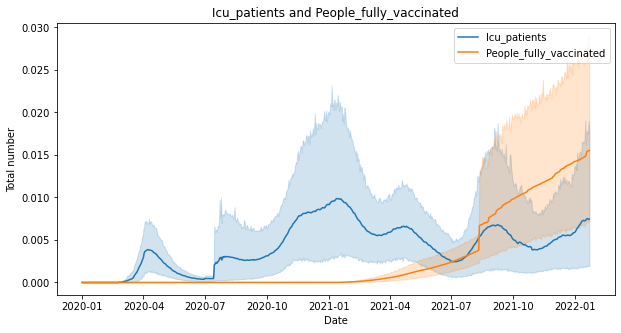

In [308]:
# Plotting for icu_patients and people_fully_vaccinated
plt.figure(figsize=(10,5))
sns.lineplot(data = dataScale['icu_patients'],label='Icu_patients')
sns.lineplot(data = dataScale['people_fully_vaccinated'],label='People_fully_vaccinated')
plt.xlabel('Date')
plt.ylabel('Total number')
plt.title('Icu_patients and People_fully_vaccinated')
plt.legend()

Before vaccination (end of 2020), the number of icu patients fluctuated in a wide range and it has a tendency to reduce when there are more people are vaccinated. This trend proves the effectiveness of Covid-19 vaccines from reduce number of Covid-19 patients hospitalised.

**Spreading progress of new cases and new deaths**

In [309]:
world_data = data.groupby(['date', 'country'])['total_cases', 'total_deaths'].max()
world_data = world_data.reset_index()
world_data['date'] = world_data['date'].dt.strftime('%m/%d/%Y')
world_data['size'] = world_data['total_cases'].pow(0.3)
import plotly.express as px
fig = px.scatter_geo(world_data, locations="country", locationmode='country names', 
                     color="total_cases", size='size', hover_name="country", 
                     range_color= [0, 1500], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

In [310]:
world_data = data.groupby(['date', 'country'])['total_cases', 'total_deaths'].max()
world_data = world_data.reset_index()
world_data['date'] = world_data['date'].dt.strftime('%m/%d/%Y')
world_data['size'] = world_data['total_deaths'].pow(0.3)

fig = px.scatter_geo(world_data, locations="country", locationmode='country names', 
                     color="total_deaths", size='size', hover_name="country", 
                     range_color= [0, 500], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Deaths Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

## **Continentwise Analysis**

In [311]:
data.groupby('continent').new_deaths.sum().sort_values(ascending=False)

continent
Europe          1,594,560.00
Asia            1,283,290.00
North America   1,269,170.00
South America   1,203,763.00
Africa            235,426.00
Oceania             5,463.00
Name: new_deaths, dtype: float64

Number of deaths in Europe is leading among 6 continents. Number of deaths in Asia, North America and South America is nearly equal.

([<matplotlib.patches.Wedge at 0x7fdffc997110>,
 [Text(0.6873165702096891, 0.8588340540029777, 'Europe'),
  Text(-0.8895816556827265, 0.6470274166314586, 'Asia'),
  Text(-0.7622481023281269, -0.7930812256617663, 'North America'),
  Text(0.7009501411074135, -0.9739963550658172, 'South America'),
  Text(1.1885241115632843, -0.16556097436505351, 'Africa'),
  Text(1.0999948187018407, -0.0033762152041633842, 'Oceania')],
 [Text(0.3748999473871031, 0.4684549385470787, '28.5%'),
  Text(-0.4852263576451235, 0.352924045435341, '23.0%'),
  Text(-0.41577169217897825, -0.4325897594518725, '22.7%'),
  Text(0.40888758231265787, -0.5681645404550599, '21.5%'),
  Text(0.6933057317452491, -0.0965772350462812, '4.2%'),
  Text(0.5999971738373676, -0.001841571929543664, '0.1%')])

(-1.1239668023594032,
 1.2048815794998493,
 -1.196746554375597,
 1.1135620779158102)

Text(0.5, 1.0, 'Total deaths per continent')

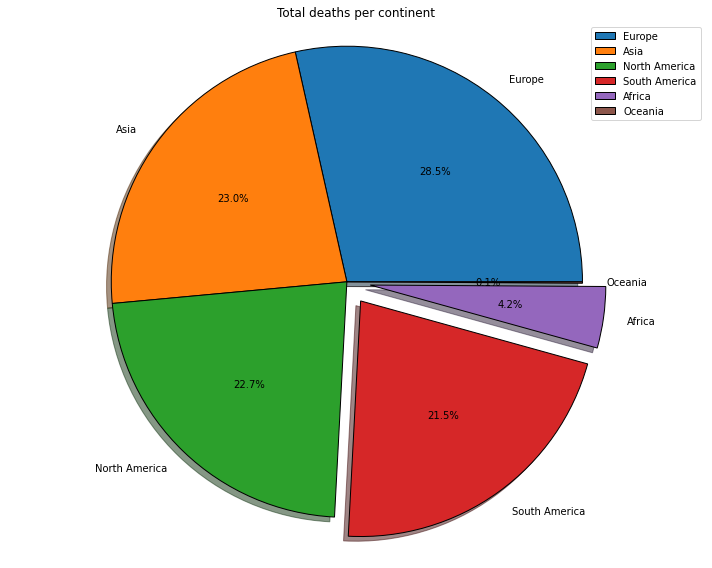

In [312]:
# Plotting pie chart for total deaths per continent
Europe = data.new_deaths[data["continent"]=="Europe"].sum()
Asia = data.new_deaths[data["continent"]=="Asia"].sum()
North_America = data.new_deaths[data["continent"]=="North America"].sum()
South_America = data.new_deaths[data["continent"]=="South America"].sum()
Africa = data.new_deaths[data["continent"]=="Africa"].sum()
Oceania = data.new_deaths[data["continent"]=="Oceania"].sum()

labels = ['Europe', 'Asia','North America','South America','Africa','Oceania']
slices = [Europe, Asia, North_America, South_America, Africa, Oceania]
explode = [0, 0, 0, 0.1, 0.1, 0]

plt.pie(slices, labels=labels, explode=explode, shadow=True,
        startangle= 0, autopct='%1.1f%%',
        wedgeprops={'edgecolor': 'black'})
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Total deaths per continent")
plt.legend()
plt.tight_layout() #Used for default padding
# plt.savefig('Total deaths per continent.jpg')
plt.show()

([<matplotlib.patches.Wedge at 0x7fdffc9cce50>,
 [Text(0.5706575200992788, 0.9403988487626628, 'Europe'),
  Text(-1.0677583052554678, 0.26437133270831686, 'Asia'),
  Text(-0.24279382112449144, -1.0728705236065388, 'North America'),
  Text(0.9613080485490173, -0.7182526267232724, 'South America'),
  Text(1.188628413914553, -0.1648104779283584, 'Africa'),
  Text(1.0997490921704303, -0.02349328138670323, 'Oceania')],
 [Text(0.3112677382359702, 0.512944826597816, '32.6%'),
  Text(-0.5824136210484369, 0.14420254511362737, '27.0%'),
  Text(-0.1324329933406317, -0.5852021037853847, '23.6%'),
  Text(0.56076302832026, -0.4189806989219088, '13.0%'),
  Text(0.6933665747834892, -0.09613944545820906, '3.0%'),
  Text(0.599863141183871, -0.012814517120019941, '0.7%')])

(-1.1145571848742695, 1.203506642760278, -1.132394278061357, 1.106872985396251)

Text(0.5, 1.0, 'Total cases per continent')

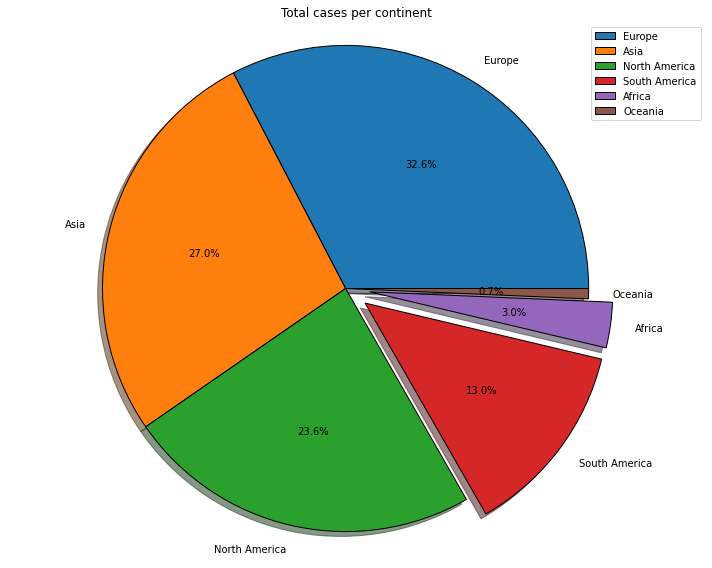

In [313]:
# Plotting pie chart for total cases per continent
Europe = data.new_cases[data["continent"]=="Europe"].sum()
Asia = data.new_cases[data["continent"]=="Asia"].sum()
North_America = data.new_cases[data["continent"]=="North America"].sum()
South_America = data.new_cases[data["continent"]=="South America"].sum()
Africa = data.new_cases[data["continent"]=="Africa"].sum()
Oceania = data.new_cases[data["continent"]=="Oceania"].sum()

labels = ['Europe', 'Asia','North America','South America','Africa','Oceania']
slices = [Europe, Asia, North_America, South_America, Africa, Oceania]
explode = [0, 0, 0, 0.1, 0.1, 0]

plt.pie(slices, labels=labels, explode=explode, shadow=True,
        startangle= 0, autopct='%1.1f%%',
        wedgeprops={'edgecolor': 'black'})
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Total cases per continent")
plt.legend()
plt.tight_layout() #Used for default padding
# plt.savefig('Total cases per continent.jpg')
plt.show()

Through these charts, we can see in most cases, the percentage of new cases is less than the percentage of deaths. But this is not true in South America and Africa. We can say that death ratio (total deaths/ total cases) in South America and Africa is higher than other continents.

##**Countrywise Analysis**

In [314]:
# Creating a dataframe with total number of cases for every country
newcases = pd.DataFrame(data.groupby('country')['new_cases'].sum())
newcases['country'] = newcases.index

global_newcases = newcases[['country','new_cases']]

fig = px.bar(global_newcases.sort_values('new_cases',ascending=False)[:10][::-1],x='new_cases',y='country',title='Top 10 countries have highest New Cases',text='new_cases', height=900, orientation='h')
fig.show()

In [315]:
# Creating a dataframe with total no of deaths for every country
deathcases = pd.DataFrame(data.groupby('country')['new_deaths'].sum())
deathcases['country'] = deathcases.index

global_deathcases = deathcases[['country','new_deaths']]

fig = px.bar(global_deathcases.sort_values('new_deaths',ascending=False)[:10][::-1],x='new_deaths',y='country',title='Top 10 countries have highest Covid-19 Deaths',text='new_deaths', height=900, orientation='h')
fig.show()

From the charts above, we can we can understand that:

- US is the leading country in number of cases and number of deaths during the time of this data set. 
- Followed by India, Brazil in top 3 places and then the rest of the countries.


#**1. What is the likelihood of dying if people infected Covid-19 in their countries?**

In [316]:
new_data = data.groupby('country')['continent','total_cases','total_deaths','people_fully_vaccinated','population'].max().sort_values(by='total_deaths',ascending=False).reset_index()
new_data['infected ratio'] = (new_data['total_cases']/new_data['population'])*100
new_data['death ratio'] = (new_data['total_deaths']/new_data['total_cases'])*100
new_data['vaccinated ratio'] = (new_data['people_fully_vaccinated']/new_data['population'])*100
new_data

,country,continent,total_cases,total_deaths,people_fully_vaccinated,population,infected ratio,death ratio,vaccinated ratio
0,United States,North America,"70,495,874.00","865,968.00","209,468,019.00","332,915,074.00",21.18,1.23,62.92
1,Brazil,South America,"23,931,609.00","623,191.00","148,534,163.00","213,993,441.00",11.18,2.60,69.41
2,India,Asia,"39,237,264.00","489,409.00","681,368,115.00","1,393,409,033.00",2.82,1.25,48.90
3,Russia,Europe,"10,860,799.00","318,869.00","69,301,031.00","145,912,022.00",7.44,2.94,47.50
4,Mexico,North America,"4,595,589.00","302,721.00","76,345,784.00","130,262,220.00",3.53,6.59,58.61
...,...,...,...,...,...,...,...,...,...
219,Tonga,Oceania,1.00,0.00,"64,680.00","106,759.00",0.00,0.00,60.59
220,Tokelau,Oceania,0.00,0.00,968.00,"1,368.00",0.00,NaN,70.76
221,Micronesia (country),Oceania,1.00,0.00,0.00,"116,255.00",0.00,0.00,0.00
222,Pitcairn,Oceania,0.00,0.00,47.00,47.00,0.00,NaN,100.00


In Canada is ranked 27th on the number of people deaths, the possibility of being infected Covid 19 in Canada is 7.58%, if people infected Covid-19, the likely hood of dying because of Covid-19 is 1.12%. And Canada is doing a great effort in vaccination progress when 78.2% Canadian are fully vaccinated.

Considering visualization on countries with the population of more than 10million because if we do not limit the population range, there are some countries with very low population will have advantage on the ratio.

In [317]:
# check top countries with population more than 10 million
big_pop_country = new_data[new_data.population > 10000000].sort_values(by='population',ascending=False).reset_index(drop=True)
big_pop_country

,country,continent,total_cases,total_deaths,people_fully_vaccinated,population,infected ratio,death ratio,vaccinated ratio
0,China,Asia,"105,605.00","4,639.00","1,224,450,000.00","1,444,216,102.00",0.01,4.39,84.78
1,India,Asia,"39,237,264.00","489,409.00","681,368,115.00","1,393,409,033.00",2.82,1.25,48.90
2,United States,North America,"70,495,874.00","865,968.00","209,468,019.00","332,915,074.00",21.18,1.23,62.92
3,Indonesia,Asia,"4,283,453.00","144,206.00","121,075,830.00","276,361,788.00",1.55,3.37,43.81
4,Pakistan,Asia,"1,367,605.00","29,097.00","78,860,543.00","225,199,929.00",0.61,2.13,35.02
...,...,...,...,...,...,...,...,...,...
86,Jordan,Asia,"1,134,097.00","13,062.00","3,933,851.00","10,269,022.00",11.04,1.15,38.31
87,Azerbaijan,Asia,"632,034.00","8,597.00","4,727,150.00","10,223,344.00",6.18,1.36,46.24
88,Portugal,Europe,"2,176,256.00","19,539.00","9,181,953.00","10,167,923.00",21.40,0.90,90.30
89,Sweden,Europe,"1,784,005.00","15,674.00","7,519,284.00","10,160,159.00",17.56,0.88,74.01


(<Figure size 720x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdffc52c290>)

Text(0.5, 1.0, 'Top 10 countries (population  > 10 million) have the highest percentage of vaccinated population')

Text(10, 0, '90.30%')

Text(10, 0, '87.73%')

Text(10, 0, '86.54%')

Text(10, 0, '85.38%')

Text(10, 0, '84.78%')

Text(10, 0, '81.78%')

Text(10, 0, '81.04%')

Text(10, 0, '79.04%')

Text(10, 0, '78.40%')

Text(10, 0, '78.20%')

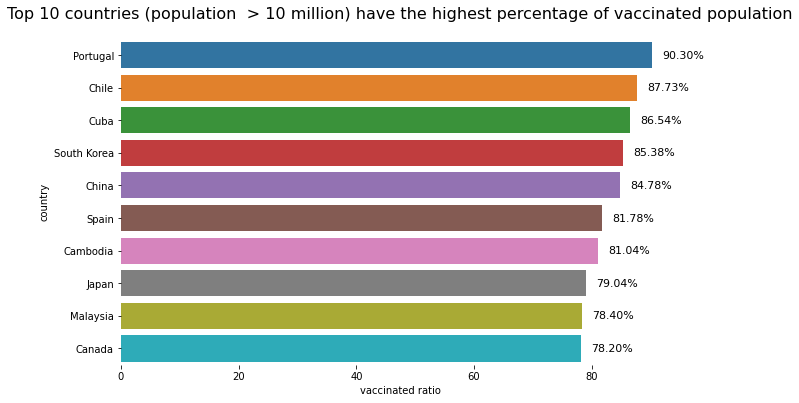

In [318]:
# Plot top 10 big_pop_countries have the highest percentage of vaccinated population
top_vaccinated_country = big_pop_country.sort_values(by='vaccinated ratio', ascending=False).head(10)
plt.subplots(figsize=(10, 6))
ax = sns.barplot(x='vaccinated ratio' , y='country', data=top_vaccinated_country)
sns.despine(left=True, bottom=True)
plt.title('Top 10 countries (population  > 10 million) have the highest percentage of vaccinated population',fontsize=16, pad=20)
#set annotation
for p in ax.patches:
    ax.annotate('{:,.2f}%'.format(float(p.get_width())),xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(10, 0), textcoords='offset points', ha='left', va='center', color='black', fontsize=11);

(<Figure size 720x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdffc73d890>)

Text(0.5, 1.0, 'Top 10 countries (population > 10 million) have the highest rate of COVID 19-related population deaths')

Text(10, 0, '18.85%')

Text(10, 0, '7.05%')

Text(10, 0, '6.59%')

Text(10, 0, '6.29%')

Text(10, 0, '5.82%')

Text(10, 0, '5.49%')

Text(10, 0, '5.47%')

Text(10, 0, '5.21%')

Text(10, 0, '4.67%')

Text(10, 0, '4.63%')

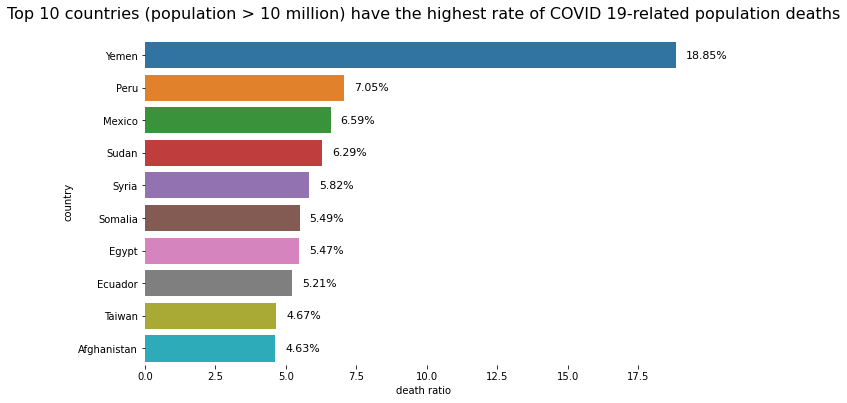

In [319]:
# Plot top 10 big_pop_countries have the highest percentage of death
Top_death_country = big_pop_country.sort_values(by='death ratio', ascending=False).head(10)
plt.subplots(figsize=(10, 6))
ax= sns.barplot(x='death ratio', y='country', data = Top_death_country)
sns.despine(left=True, bottom=True)
plt.title('Top 10 countries (population > 10 million) have the highest rate of COVID 19-related population deaths',fontsize=16, pad=20)
#set annotation
for p in ax.patches:
    ax.annotate('{:,.2f}%'.format(float(p.get_width())), xy=(p.get_width(), p.get_y()+p.get_height()/2), xytext=(10, 0), textcoords='offset points', ha='left', va='center', color='black', fontsize=11);

Countries with high ratio of vaccination do not exist in the list of high death ratio. We will study the relationship between vaccination and death ratio in the next part of this project.

#**2. Clustering of countries based on death ratio**

In [320]:
new_data.head()

,country,continent,total_cases,total_deaths,people_fully_vaccinated,population,infected ratio,death ratio,vaccinated ratio
0,United States,North America,"70,495,874.00","865,968.00","209,468,019.00","332,915,074.00",21.18,1.23,62.92
1,Brazil,South America,"23,931,609.00","623,191.00","148,534,163.00","213,993,441.00",11.18,2.60,69.41
2,India,Asia,"39,237,264.00","489,409.00","681,368,115.00","1,393,409,033.00",2.82,1.25,48.90
3,Russia,Europe,"10,860,799.00","318,869.00","69,301,031.00","145,912,022.00",7.44,2.94,47.50
4,Mexico,North America,"4,595,589.00","302,721.00","76,345,784.00","130,262,220.00",3.53,6.59,58.61


In [321]:
# Check null values
new_data.isna().sum()

country                    0
continent                  0
total_cases                0
total_deaths               0
people_fully_vaccinated    0
population                 0
infected ratio             0
death ratio                9
vaccinated ratio           0
dtype: int64

In [322]:
# Drop null values
new_data = new_data.dropna()

In [323]:
new_data.isna().sum().sum()

0

In [324]:
# Creating new data frame including country and death ratio for clustering
cluster = new_data.loc[:,['country', 'death ratio']]

In [325]:
# set country attribute as index
cluster = cluster.set_index('country')
cluster.head()

,death ratio
country,
United States,1.23
Brazil,2.60
India,1.25
Russia,2.94
Mexico,6.59


In [326]:
#Standard Scaling since K-Means Clustering is a distance based alogrithm
from sklearn.preprocessing import StandardScaler
std=StandardScaler()
cluster = std.fit_transform(cluster)

In [327]:
# find optimal number of clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
wcss=[]
sil=[]
for i in range(2,11):
    clf=KMeans(n_clusters=i,init='k-means++',random_state=42)
    clf.fit(cluster)
    labels=clf.labels_
    centroids=clf.cluster_centers_
    sil.append(silhouette_score(cluster, labels, metric='euclidean'))
    wcss.append(clf.inertia_)

KMeans(n_clusters=2, random_state=42)

KMeans(n_clusters=3, random_state=42)

KMeans(n_clusters=4, random_state=42)

KMeans(n_clusters=5, random_state=42)

KMeans(n_clusters=6, random_state=42)

KMeans(n_clusters=7, random_state=42)

KMeans(random_state=42)

KMeans(n_clusters=9, random_state=42)

KMeans(n_clusters=10, random_state=42)

<Figure size 720x360 with 0 Axes>

Text(0.5, 0, 'Number of Clusters')

Text(0, 0.5, 'Within Cluster Sum of Squares (WCSS)')

Text(0.5, 1.0, 'Elbow Method')

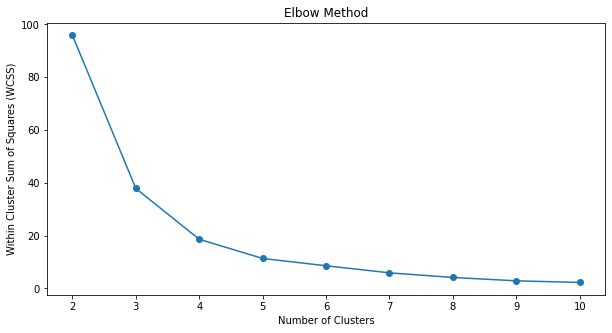

In [328]:
# Use Elbow plot to find the optimal value
x=np.arange(2,11)
plt.figure(figsize=(10,5))
plt.plot(x,wcss,marker='o')
plt.xlabel("Number of Clusters")
plt.ylabel("Within Cluster Sum of Squares (WCSS)")
plt.title("Elbow Method")

<Figure size 720x576 with 0 Axes>

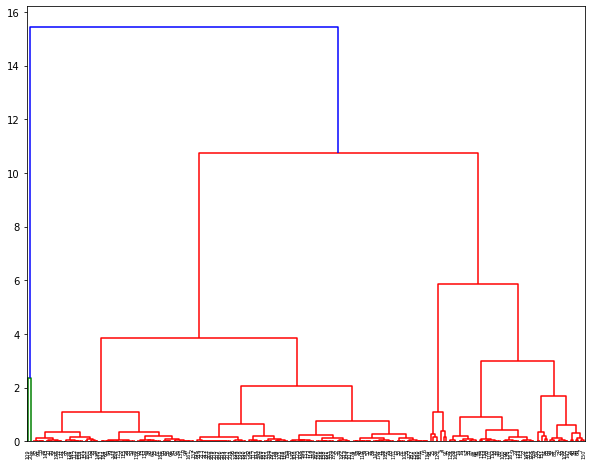

In [329]:
# Hierarchical Clustering to find the optimal 
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(10,8))
dendogram=sch.dendrogram(sch.linkage(cluster, method  = "ward"))

Both Elbow Method and Hierarchical Clustering show K=3 will be optimal number of clusters.


In [330]:
clf_final=KMeans(n_clusters=3,init='k-means++',random_state=6)
clf_final.fit(cluster)

KMeans(n_clusters=3, random_state=6)

In [331]:
# Add the Cluster column to the new_data
new_data["Clusters"]=clf_final.predict(cluster)
new_data.head()

,country,continent,total_cases,total_deaths,people_fully_vaccinated,population,infected ratio,death ratio,vaccinated ratio,Clusters
0,United States,North America,"70,495,874.00","865,968.00","209,468,019.00","332,915,074.00",21.18,1.23,62.92,0
1,Brazil,South America,"23,931,609.00","623,191.00","148,534,163.00","213,993,441.00",11.18,2.60,69.41,1
2,India,Asia,"39,237,264.00","489,409.00","681,368,115.00","1,393,409,033.00",2.82,1.25,48.90,0
3,Russia,Europe,"10,860,799.00","318,869.00","69,301,031.00","145,912,022.00",7.44,2.94,47.50,1
4,Mexico,North America,"4,595,589.00","302,721.00","76,345,784.00","130,262,220.00",3.53,6.59,58.61,1


In [332]:
# Find average death ratio of each cluster
print("Average Death Ratio of Cluster 0: ",new_data[new_data["Clusters"]==0]["death ratio"].mean())
print("Average Death Ratio of Cluster 1: ",new_data[new_data["Clusters"]==1]["death ratio"].mean())
print("Average Death Ratio of Cluster 2: ",new_data[new_data["Clusters"]==2]["death ratio"].mean())

Average Death Ratio of Cluster 0:  0.9294452502500881
Average Death Ratio of Cluster 1:  3.2569251397189696
Average Death Ratio of Cluster 2:  16.56656994399082


<Figure size 720x360 with 0 Axes>

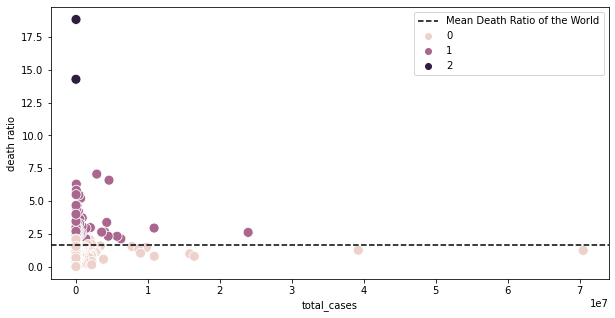

In [333]:
# Plotting clusters and average death ratio of the world
plt.figure(figsize=(10,5))
sns.scatterplot(x=new_data["total_cases"],y=new_data["death ratio"],hue=new_data["Clusters"],s=100)
plt.axhline(new_data["death ratio"].mean(),
            color='black',linestyle="--",label="Mean Death Ratio of the World")
plt.legend()

The countries below the average line are below the risk of average death and those above the line are above the risk.

In [334]:
# Check which countries belong to each cluster
print("Few Countries belonging to Cluster 0: ",list(new_data[new_data["Clusters"]==0].head(10).country))
print("Few Countries belonging to Cluster 1: ",list(new_data[new_data["Clusters"]==1].head(10).country))
print("Few Countries belonging to Cluster 2: ",list(new_data[new_data["Clusters"]==2].head(10).country))

Few Countries belonging to Cluster 0:  ['United States', 'India', 'United Kingdom', 'Italy', 'France', 'Argentina', 'Germany', 'Spain', 'Turkey', 'Philippines']
Few Countries belonging to Cluster 1:  ['Brazil', 'Russia', 'Mexico', 'Peru', 'Indonesia', 'Iran', 'Colombia', 'Ukraine', 'Poland', 'South Africa']
Few Countries belonging to Cluster 2:  ['Yemen', 'Vanuatu']


US, India, UK, Italy, France, Germany, Spain, Turkey are countries in the top 10 have highest Covid-19 cases in the word; but they are belong to Cluster 0 which have low death ratio. One of the reason is that they got vaccines in the early stage.  

#**3. How does vaccination impact the number of people dying because of Covid-19?**

In this part, we will explore the effectiveness of Covid-19 vaccines in 3 countries: Canada, US and Vietnam.

##**Canada**

In [335]:
# Creating a new dataframe related to Canada
Canada = data[data.country == 'Canada'].reset_index(drop=True)
Canada.head()

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,icu_patients,people_fully_vaccinated,population
0,North America,Canada,2020-01-26,1.00,1.00,0.00,0.00,0.00,0.00,"38,067,913.00"
1,North America,Canada,2020-01-27,1.00,0.00,0.00,0.00,0.00,0.00,"38,067,913.00"
2,North America,Canada,2020-01-28,2.00,1.00,0.00,0.00,0.00,0.00,"38,067,913.00"
3,North America,Canada,2020-01-29,2.00,0.00,0.00,0.00,0.00,0.00,"38,067,913.00"
4,North America,Canada,2020-01-30,2.00,0.00,0.00,0.00,0.00,0.00,"38,067,913.00"


<Figure size 720x360 with 0 Axes>

Text(0.5, 1.0, 'Correlation matrix using Pearson method ')

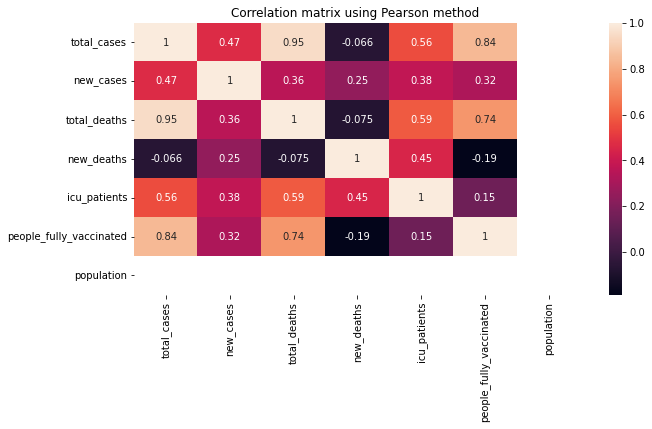

In [336]:
plt.figure(figsize=(10,5))
sns.heatmap(Canada.corr(), annot=True)
plt.title("Correlation matrix using Pearson method ")
#plt.savefig("corr.png",bbox_inches='tight' )
plt.show()

The above graphic shows that the relation between two variables using Pearson method and shows how the change in one variable impact other. The value varies between -1 to 1. There are some pairs of strong correlation has been observed: total cases & total deaths; total cases & people fully vaccinated; total deaths & people fully vaccinated.

**How does the people_fully_vaccinated impact COVID-19 situation in Canada?**

https://en.wikipedia.org/wiki/COVID-19_vaccination_in_Canada
According to Wikipedia, Canada rolled out the vaccination campaign on December 14, 2020. So this day will be a milestone for my analysis. I will check the trend before and after vaccination.

In [337]:
# Create a subset of Canada before December 14,2020
Ca_before_vac = Canada[Canada.date <='2020-12-14']
Ca_before_vac.tail(1)

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,icu_patients,people_fully_vaccinated,population
323,North America,Canada,2020-12-14,"474,661.00","8,645.00","13,677.00",140.00,685.00,0.00,"38,067,913.00"


In [338]:
# Create new data frame which is the last record of the date before Canada rolled out vaccination
new_Ca_before_vac = Ca_before_vac[['continent','total_cases','total_deaths','icu_patients','people_fully_vaccinated','population']].tail(1)
new_Ca_before_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population
323,North America,"474,661.00","13,677.00",685.00,0.00,"38,067,913.00"


In [339]:
# Add ratios into new_Ca_before_vac data frame
new_Ca_before_vac['infected ratio'] = (new_Ca_before_vac['total_cases']/new_Ca_before_vac['population'])*100
new_Ca_before_vac['death ratio'] = (new_Ca_before_vac['total_deaths']/new_Ca_before_vac['total_cases'])*100
new_Ca_before_vac['icu ratio'] = (new_Ca_before_vac['icu_patients']/new_Ca_before_vac['total_cases'])*100
new_Ca_before_vac['vaccinated ratio'] = (new_Ca_before_vac['people_fully_vaccinated']/new_Ca_before_vac['population'])*100
new_Ca_before_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population,infected ratio,death ratio,icu ratio,vaccinated ratio
323,North America,"474,661.00","13,677.00",685.00,0.00,"38,067,913.00",1.25,2.88,0.14,0.00


In [340]:
# Create a subset of Canada after December 14,2020
Ca_after_vac = Canada[Canada.date >'2020-12-14']
new_Ca_after_vac = Ca_after_vac[['continent','total_cases','total_deaths','icu_patients','people_fully_vaccinated','population']].tail(1)
new_Ca_after_vac['infected ratio'] = (new_Ca_after_vac['total_cases']/new_Ca_after_vac['population'])*100
new_Ca_after_vac['death ratio'] = (new_Ca_after_vac['total_deaths']/new_Ca_after_vac['total_cases'])*100
new_Ca_after_vac['icu ratio'] = (new_Ca_after_vac['icu_patients']/new_Ca_after_vac['total_cases'])*100
new_Ca_after_vac['vaccinated ratio'] = (new_Ca_after_vac['people_fully_vaccinated']/new_Ca_after_vac['population'])*100
new_Ca_after_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population,infected ratio,death ratio,icu ratio,vaccinated ratio
727,North America,"2,885,629.00","32,294.00","1,219.00","29,770,485.00","38,067,913.00",7.58,1.12,0.04,78.20


From these results, we can see that Canada has reduced death ratio from 2.88 to 1.12 and icu ratio from 0.14 to 0.04 while infected ratio increased from 1.25 to 7.58. This proves that despite of Covid spreading, vaccines helps reduce the severity of Covid-19 virus in Canada.

**Plot to see the trend of new cases, new deaths and icu patients with people fully vaccinated in Canada**

In [341]:
# Find the date has the lowest new cases after vaccination
lowest_cases_after_vaccine = Ca_after_vac[Ca_after_vac.new_cases >1].sort_values(by='new_cases',ascending=True).head(1)
lowest_cases_after_vaccine

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,icu_patients,people_fully_vaccinated,population
522,North America,Canada,2021-07-01,"1,423,321.00",151.00,"26,315.00",19.00,435.00,"12,198,554.00","38,067,913.00"


In [342]:
# Mark the date when 'new_case' is lowest
lowest_cases_after_vaccine_date = lowest_cases_after_vaccine.date
lowest_cases_after_vaccine_date

522   2021-07-01
Name: date, dtype: datetime64[ns]

(<Figure size 1008x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdffbadd3d0>)

Text(0.5, 1.0, 'How does the number of people fully vaccinated affect new COVID-19 cases in Canada?')

Text(-30, 0, 'First Vaccine Day')

Text(-30, 0, 'Lowest\n New Cases\n Date')

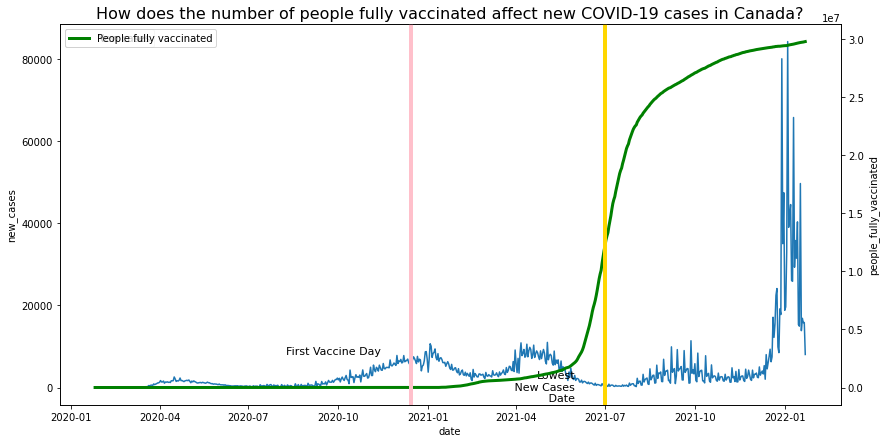

In [343]:
# Show the impact of vaccine to 'new_cases' in Canada within the period of dataset
plt.subplots(figsize=(14, 7))
ax = sns.lineplot(x='date', y='new_cases', data = Canada, label = 'New cases')
#Create 2nd line for number of people fully vaccinated
ax1 = ax.twinx()
ax1 = sns.lineplot(x='date', y='people_fully_vaccinated', data = Canada, label = 'People fully vaccinated', color = 'green',linewidth = 3)
#Add vertical line
plt.axvline(dt.datetime(2020,12,14), linewidth = 4, color='pink')
plt.axvline(lowest_cases_after_vaccine_date, linewidth = 4, color='gold')
plt.title('How does the number of people fully vaccinated affect new COVID-19 cases in Canada?',fontsize=16)
#Set annotation
ax.annotate('First Vaccine Day', xy=(dt.datetime(2020,12,14), 8800),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points', size=11, ha='right', va='center')
ax.annotate('Lowest\n New Cases\n Date', xy=(lowest_cases_after_vaccine_date, lowest_cases_after_vaccine.new_cases),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points', size=11, ha='right', va='center')

The number of new Covid cases generally reached bottom when there were many people fully vaccinated. But even the number of fully vaccinated Canadian surged significantly, the new cases also reached the peak in Jan 2022. This was because of new virant - Omicron. We can say the current vaccine can't prevent us from being infected new variant.

(<Figure size 1008x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdffbaddd50>)

Text(0.5, 1.0, 'How does the number of people fully vaccinated affect new COVID-19 deaths in Canada?')

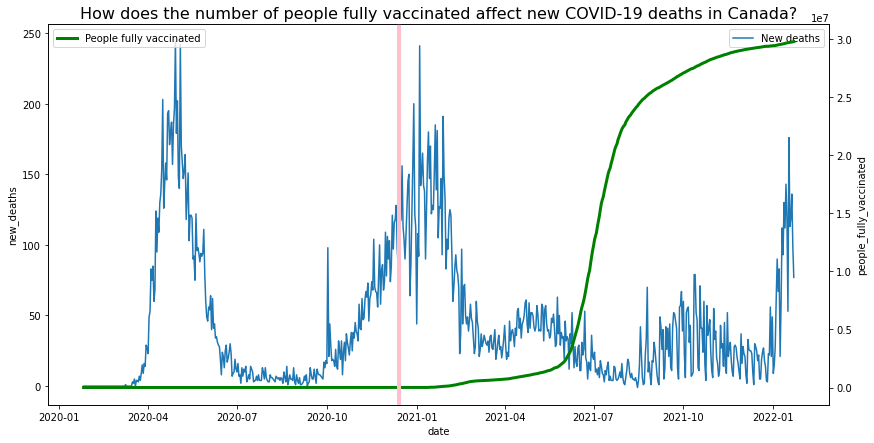

In [344]:
# Show the impact of vaccine to 'new_deaths' in Canada within the period of dataset
plt.subplots(figsize=(14, 7))
ax = sns.lineplot(x='date', y='new_deaths', data = Canada, label = 'New deaths')
#Create 2nd line for number of people fully vaccinated
ax1 = ax.twinx()
ax1 = sns.lineplot(x='date', y='people_fully_vaccinated', data = Canada, label = 'People fully vaccinated', color = 'green',linewidth = 3)
#Add vertical line
plt.axvline(dt.datetime(2020,12,14), linewidth = 4, color='pink')
plt.title('How does the number of people fully vaccinated affect new COVID-19 deaths in Canada?',fontsize=16)
plt.legend()

From the chart above, I noted that there is the opposite between trend of deaths and people fully vaccinated. This proves for the efficiency of vaccine to reduce the risk of dying because of Covid19.

(<Figure size 1008x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdffc60d110>)

Text(0.5, 1.0, 'How does the number of people fully vaccinated affect icu_patients in Canada?')

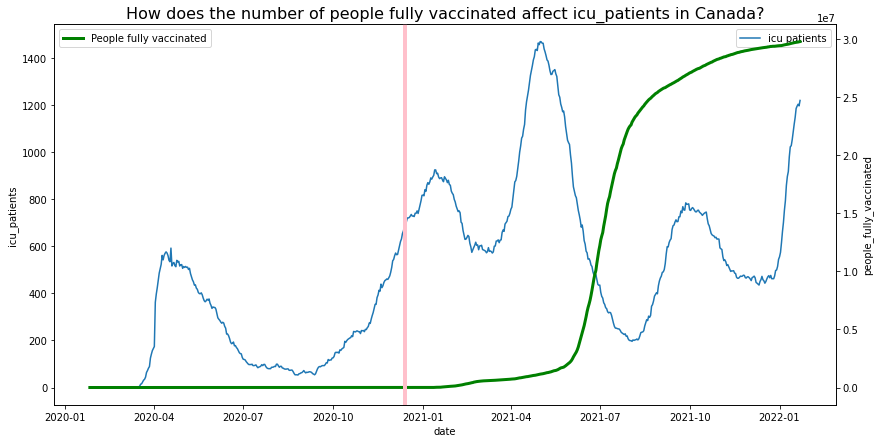

In [345]:
# Show the impact of vaccine to 'icu_patients' in Canada within the period of dataset
plt.subplots(figsize=(14, 7))
ax = sns.lineplot(x='date', y='icu_patients', data = Canada, label = 'icu patients')
#Create 2nd line for number of people fully vaccinated
ax1 = ax.twinx()
ax1 = sns.lineplot(x='date', y='people_fully_vaccinated', data = Canada, label = 'People fully vaccinated', color = 'green',linewidth = 3)
#Add vertical line
plt.axvline(dt.datetime(2020,12,14), linewidth = 4, color='pink')
plt.title('How does the number of people fully vaccinated affect icu_patients in Canada?',fontsize=16)
plt.legend()

The number of icu patients is going downward when vaccination upwards. We can say vaccines help lessen severity when people are infected Covid-19.

##**United States**

**How does the people_fully_vaccinated impact COVID-19 situation in US?**

In [346]:
US = data[data.country == 'United States'].reset_index(drop=True)
US.head()

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,icu_patients,people_fully_vaccinated,population
0,North America,United States,2020-01-22,1.00,0.00,0.00,0.00,0.00,0.00,"332,915,074.00"
1,North America,United States,2020-01-23,1.00,0.00,0.00,0.00,0.00,0.00,"332,915,074.00"
2,North America,United States,2020-01-24,2.00,1.00,0.00,0.00,0.00,0.00,"332,915,074.00"
3,North America,United States,2020-01-25,2.00,0.00,0.00,0.00,0.00,0.00,"332,915,074.00"
4,North America,United States,2020-01-26,5.00,3.00,0.00,0.00,0.00,0.00,"332,915,074.00"


On December 13, 2020, the first vaccine doses were administered in US.
https://en.wikipedia.org/wiki/COVID-19_vaccination_in_the_United_States

In [347]:
# Create a subset of US before December 13,2020
US_before_vac = US[US.date < '2020-12-13']
new_US_before_vac = US_before_vac[['continent','total_cases','total_deaths','icu_patients','people_fully_vaccinated','population']].tail(1)
new_US_before_vac['infected ratio'] = (new_US_before_vac['total_cases']/new_US_before_vac['population'])*100
new_US_before_vac['death ratio'] = (new_US_before_vac['total_deaths']/new_US_before_vac['total_cases'])*100
new_US_before_vac['icu ratio'] = (new_US_before_vac['icu_patients']/new_US_before_vac['total_cases'])*100
new_US_before_vac['vaccinated ratio'] = (new_US_before_vac['people_fully_vaccinated']/new_US_before_vac['population'])*100
new_US_before_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population,infected ratio,death ratio,icu ratio,vaccinated ratio
325,North America,"16,218,198.00","301,806.00","24,634.00",0.00,"332,915,074.00",4.87,1.86,0.15,0.00


In [348]:
# Create a subset of US after December 13,2020
US_after_vac = US[US.date >='2020-12-13']
new_US_after_vac = US_after_vac[['continent','total_cases','total_deaths','icu_patients','people_fully_vaccinated','population']].tail(1)
new_US_after_vac['infected ratio'] = (new_US_after_vac['total_cases']/new_US_after_vac['population'])*100
new_US_after_vac['death ratio'] = (new_US_after_vac['total_deaths']/new_US_after_vac['total_cases'])*100
new_US_after_vac['icu ratio'] = (new_US_after_vac['icu_patients']/new_US_after_vac['total_cases'])*100
new_US_after_vac['vaccinated ratio'] = (new_US_after_vac['people_fully_vaccinated']/new_US_after_vac['population'])*100
new_US_after_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population,infected ratio,death ratio,icu ratio,vaccinated ratio
731,North America,"70,495,874.00","865,968.00","26,035.00","209,468,019.00","332,915,074.00",21.18,1.23,0.04,62.92


From these results, we can see that US has reduced death ratio from 1.86 to 1.23 and icu ratio from 0.15 to 0.04 while infected ratio increased from 4.87 to 21.18. This proves that despite of Covid spreading, vaccines helps reduce the severity of Covid-19 virus in US.

##**United Kingdom**

**How does the people_fully_vaccinated impact COVID-19 situation in UK?**

In [349]:
UK = data[data.country == 'United Kingdom'].reset_index(drop=True)
UK.head()

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,icu_patients,people_fully_vaccinated,population
0,Europe,United Kingdom,2020-01-31,2.00,2.00,0.00,0.00,0.00,0.00,"68,207,114.00"
1,Europe,United Kingdom,2020-02-01,2.00,0.00,0.00,0.00,0.00,0.00,"68,207,114.00"
2,Europe,United Kingdom,2020-02-02,2.00,0.00,0.00,0.00,0.00,0.00,"68,207,114.00"
3,Europe,United Kingdom,2020-02-03,8.00,6.00,0.00,0.00,0.00,0.00,"68,207,114.00"
4,Europe,United Kingdom,2020-02-04,8.00,0.00,0.00,0.00,0.00,0.00,"68,207,114.00"


UK began administration of COVID-19 vaccines on 08 December 2020.
https://en.wikipedia.org/wiki/COVID-19_vaccination_in_the_United_Kingdom

In [350]:
# Create a subset of UK before Dec 08,2020
UK_before_vac = UK[UK.date < '2020-12-08']
new_UK_before_vac = UK_before_vac[['continent','total_cases','total_deaths','icu_patients','people_fully_vaccinated','population']].tail(1)
new_UK_before_vac['infected ratio'] = (new_UK_before_vac['total_cases']/new_UK_before_vac['population'])*100
new_UK_before_vac['death ratio'] = (new_UK_before_vac['total_deaths']/new_UK_before_vac['total_cases'])*100
new_UK_before_vac['icu ratio'] = (new_UK_before_vac['icu_patients']/new_UK_before_vac['total_cases'])*100
new_UK_before_vac['vaccinated ratio'] = (new_UK_before_vac['people_fully_vaccinated']/new_UK_before_vac['population'])*100
new_UK_before_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population,infected ratio,death ratio,icu ratio,vaccinated ratio
311,Europe,"1,739,636.00","61,482.00","1,271.00",0.00,"68,207,114.00",2.55,3.53,0.07,0.00


In [351]:
# Create a subset of UK after Dec 08,2020
UK_after_vac = UK[UK.date >='2020-12-08']
new_UK_after_vac = UK_after_vac[['continent','total_cases','total_deaths','icu_patients','people_fully_vaccinated','population']].tail(1)
new_UK_after_vac['infected ratio'] = (new_UK_after_vac['total_cases']/new_UK_after_vac['population'])*100
new_UK_after_vac['death ratio'] = (new_UK_after_vac['total_deaths']/new_UK_after_vac['total_cases'])*100
new_UK_after_vac['icu ratio'] = (new_UK_after_vac['icu_patients']/new_UK_after_vac['total_cases'])*100
new_UK_after_vac['vaccinated ratio'] = (new_UK_after_vac['people_fully_vaccinated']/new_UK_after_vac['population'])*100
new_UK_after_vac

,continent,total_cases,total_deaths,icu_patients,people_fully_vaccinated,population,infected ratio,death ratio,icu ratio,vaccinated ratio
722,Europe,"15,822,720.00","153,913.00",664.00,"48,115,948.00","68,207,114.00",23.20,0.97,0.00,70.54


Again, same thing happen in UK, despite there are more British who are fully vaccinated, the new variant is still spreading at lightening speed. So we can say, vaccine cannot stop Covid's spreading. However, it helps reduce death ratio from 3.53 to 0.97 and icu ratio from 0.07 to 0.

##**Compare before and after vaccination**.

                 CA    US    UK
Before vaccine 1.25  4.87  2.55
After vaccine  7.58 21.18 23.20


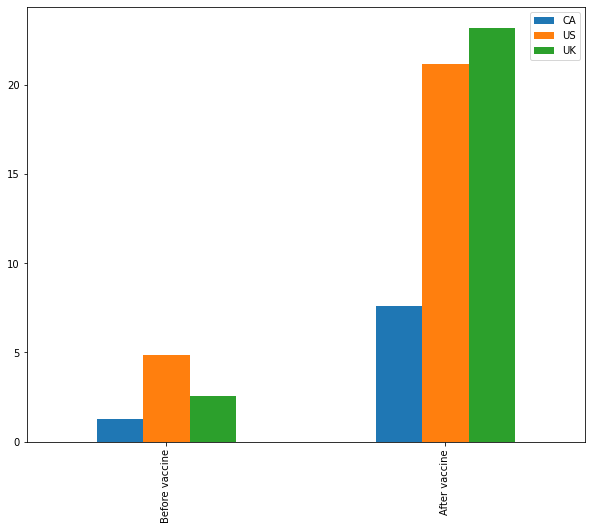

In [352]:
# assign data of lists.  
Comparision_infected = {'CA':[1.25, 7.58], 'US':[4.87, 21.18], 'UK':[2.55, 23.20]}  
# Creates pandas DataFrame.  
df_infected = pd.DataFrame(Comparision_infected, index =['Before vaccine', 'After vaccine'])  
# print the data  
print(df_infected)  
df_infected.plot.bar()

The bar plot above shows that the percentage of population infected Covid-19 increased significantly over the time even there are more people who are fully vaccinated. One more time, we can say vaccine can't stop spreading virus among people.

                 CA   US   UK
Before vaccine 2.88 1.86 3.53
After vaccine  1.12 1.23 0.97


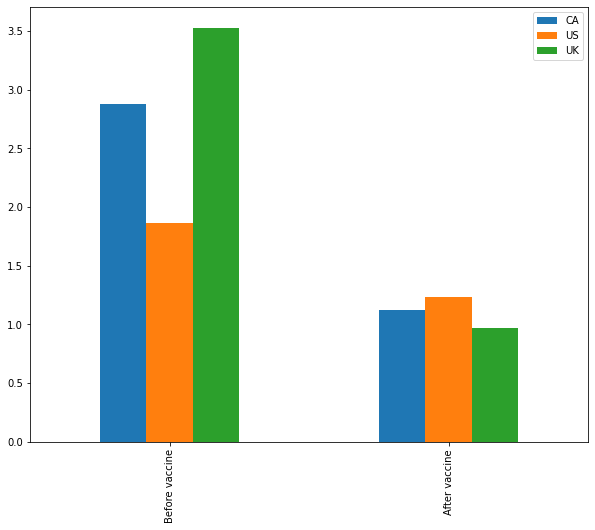

In [353]:
# assign data of lists.  
Comparision_death = {'CA':[2.88, 1.12], 'US':[1.86, 1.23], 'UK':[3.53, 0.97]}    
# Creates pandas DataFrame.  
df_death = pd.DataFrame(Comparision_death, index =['Before vaccine', 'After vaccine'])    
# print the data  
print(df_death) 
df_death.plot.bar()

From the above chart, we can conclude that vaccine can help reduce the risk of dying when they are positive with Covid 19. Canada, US and UK are typical examples. 

                 CA   US   UK
Before vaccine 0.14 0.15 0.07
After vaccine  0.04 0.04 0.00


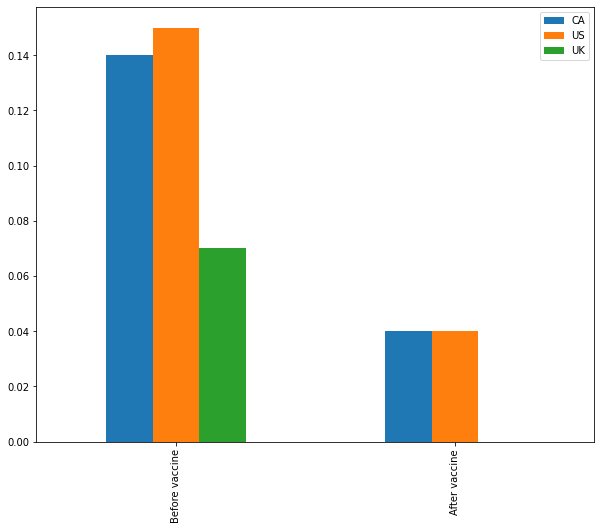

In [354]:
# assign data of lists.  
Comparision_icu = {'CA':[0.14, 0.04], 'US':[0.15, 0.04],'UK':[0.07, 0.00]}    
# Creates pandas DataFrame.  
df_icu = pd.DataFrame(Comparision_icu, index =['Before vaccine', 'After vaccine'])    
# print the data  
print(df_icu) 
df_icu.plot.bar()

This chart proves more clearly about the effectiveness of vaccine. It reduces the percentage of icu patients after vaccination. Or in the other way, we can say, vaccine can lessen the severity of Covid 19 when they are infected.

Next part, we will predict number of new Covid-19 cases in Canada in next 2 weeks by applying some machine learning models. 

In [355]:
# Export clean data to csv file
Canada.to_csv(r'C:\Users\emily\OneDrive - St. Clair College\Desktop\St Clair\semester 4\DAB 402 - Capstone Projects\Capstone project\Canada_data.csv', index = False, header=True)